In [50]:
import numpy as np
import matplotlib.pyplot as plt
import time
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np
from sklearn.preprocessing import StandardScaler
import plotly.express as px

# Résultats pour k-means avec la recence

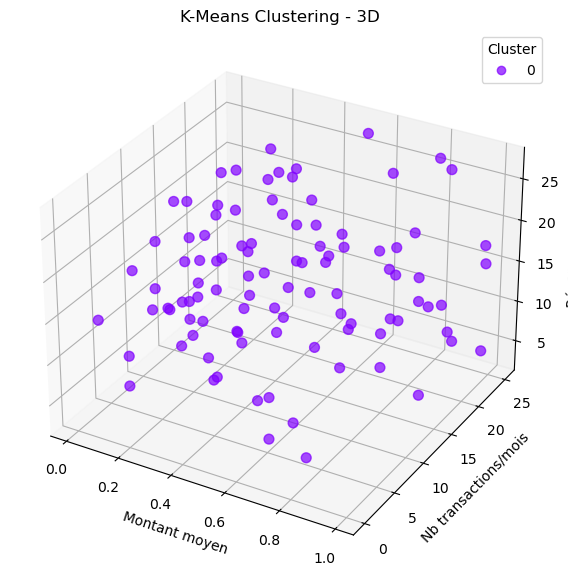

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans, DBSCAN

df = pd.read_csv("societaires_100.csv", encoding="latin1", sep=";")

cols_num = ["montant_moyen", "nb_transactions_mois", "dernière_transaction_jour"]
for col in cols_num:
    df[col] = pd.to_numeric(df[col], errors="coerce")

df = df.dropna(subset=cols_num)

X = df[cols_num].values

# ------------------------
# K-MEANS
# ------------------------
k = 1
kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
df["cluster"] = kmeans.fit_predict(X)

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df["montant_moyen"], 
                     df["nb_transactions_mois"], 
                     df["dernière_transaction_jour"], 
                     c=df["cluster"], cmap="rainbow", s=50, alpha=0.7)
ax.set_xlabel("Montant moyen")
ax.set_ylabel("Nb transactions/mois")
ax.set_zlabel("Récence (jours)")
ax.set_title("K-Means Clustering - 3D")
plt.legend(*scatter.legend_elements(), title="Cluster")
plt.show()

# ------------------------



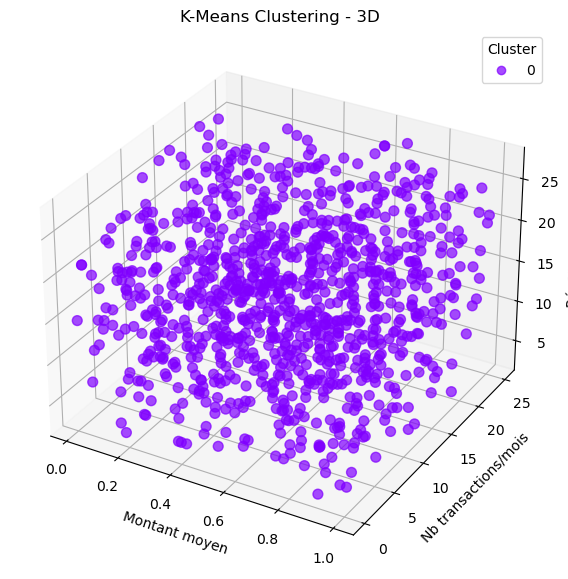

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans, DBSCAN

df = pd.read_csv("societaires.csv", encoding="latin1", sep=";")

cols_num = ["montant_moyen", "nb_transactions_mois", "dernière_transaction_jour"]
for col in cols_num:
    df[col] = pd.to_numeric(df[col], errors="coerce")

df = df.dropna(subset=cols_num)

X = df[cols_num].values

# ------------------------
# K-MEANS
# ------------------------
k = 1
kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
df["cluster"] = kmeans.fit_predict(X)

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df["montant_moyen"], 
                     df["nb_transactions_mois"], 
                     df["dernière_transaction_jour"], 
                     c=df["cluster"], cmap="rainbow", s=50, alpha=0.7)
ax.set_xlabel("Montant moyen")
ax.set_ylabel("Nb transactions/mois")
ax.set_zlabel("Récence (jours)")
ax.set_title("K-Means Clustering - 3D")
plt.legend(*scatter.legend_elements(), title="Cluster")
plt.show()

# ------------------------



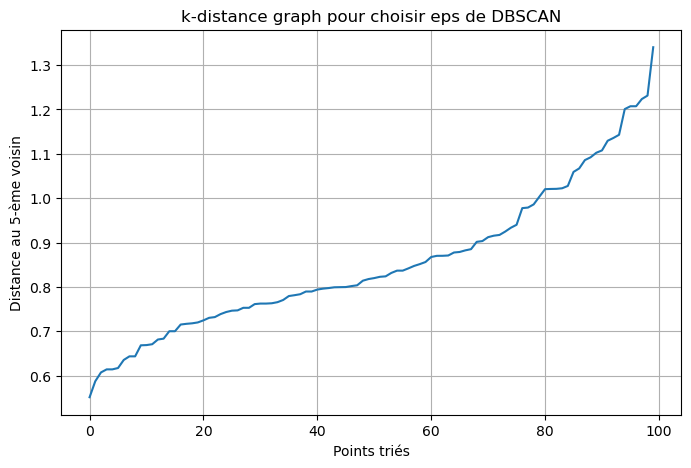

Valeur eps suggérée : 1.11
Nombre de clients anomalies détectés : 0


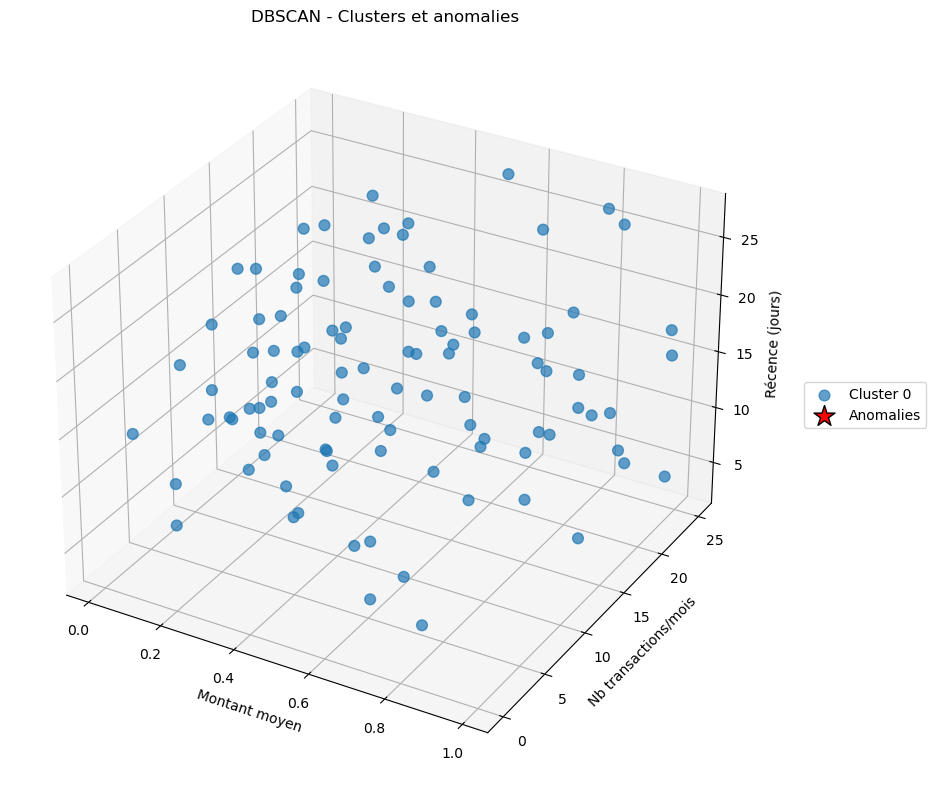

✅ Résultats sauvegardés dans resultats_dbscan_normalized_100.csv


In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN

# ------------------------
# 1️⃣ Charger les données
# ------------------------
df = pd.read_csv("societaires_100.csv", encoding="latin1", sep=";")
cols_num = ["montant_moyen", "nb_transactions_mois", "dernière_transaction_jour"]
for col in cols_num:
    df[col] = pd.to_numeric(df[col], errors="coerce")
df = df.dropna(subset=cols_num)

X_raw = df[cols_num].values  # valeurs originales pour affichage
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_raw)  # normalisation pour DBSCAN

# ------------------------
# 2️⃣ Calculer la distance au kème voisin (sur données normalisées)
# ------------------------
min_samples = 5
neigh = NearestNeighbors(n_neighbors=min_samples)
nbrs = neigh.fit(X_scaled)
distances, indices = nbrs.kneighbors(X_scaled)
k_distances = np.sort(distances[:, -1])

plt.figure(figsize=(8,5))
plt.plot(k_distances)
plt.xlabel("Points triés")
plt.ylabel(f"Distance au {min_samples}-ème voisin")
plt.title("k-distance graph pour choisir eps de DBSCAN")
plt.grid(True)
plt.show()

# Choisir eps automatiquement à partir du 90ème percentile
eps_val = k_distances[int(len(k_distances)*0.9)]
print(f"Valeur eps suggérée : {eps_val:.2f}")

# ------------------------
# 3️⃣ Appliquer DBSCAN (sur données normalisées)
# ------------------------
dbscan = DBSCAN(eps=eps_val, min_samples=min_samples)
df["anomalie"] = dbscan.fit_predict(X_scaled)

# Nombre d'anomalies
outliers = df[df["anomalie"] == -1]
print("Nombre de clients anomalies détectés :", len(outliers))

# ------------------------
# 4️⃣ Visualisation 3D avec valeurs originales
# ------------------------
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111, projection='3d')

# Affichage des clusters
cluster_points = df[df["anomalie"] != -1]
num_clusters = len(cluster_points["anomalie"].unique())
colors = plt.cm.tab10(np.linspace(0, 1, num_clusters))

for cid, color in zip(sorted(cluster_points["anomalie"].unique()), colors):
    subset = df[df["anomalie"] == cid]
    ax.scatter(subset["montant_moyen"], 
               subset["nb_transactions_mois"], 
               subset["dernière_transaction_jour"], 
               c=[color], s=60, alpha=0.7, label=f"Cluster {cid}")

# Affichage des anomalies avec gros marqueur rouge
anomalies = df[df["anomalie"] == -1]
ax.scatter(anomalies["montant_moyen"], 
           anomalies["nb_transactions_mois"], 
           anomalies["dernière_transaction_jour"], 
           c="red", s=250, marker="*", edgecolor="k", label="Anomalies")

ax.set_xlabel("Montant moyen")
ax.set_ylabel("Nb transactions/mois")
ax.set_zlabel("Récence (jours)")
ax.set_title("DBSCAN - Clusters et anomalies")

ax.legend(loc='center left', bbox_to_anchor=(1.05, 0.5))
plt.tight_layout()
plt.show()

# ------------------------
# 5️⃣ Sauvegarde des résultats
# ------------------------
df.to_csv("resultats_dbscan_normalized_100.csv", index=False, encoding="utf-8")
print("✅ Résultats sauvegardés dans resultats_dbscan_normalized_100.csv")


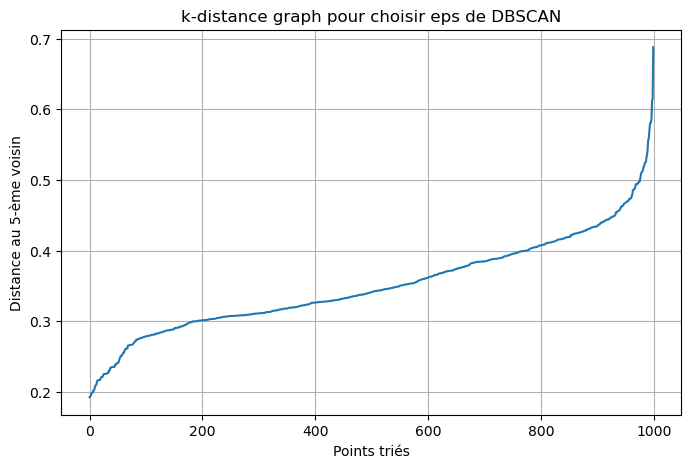

Valeur eps suggérée : 0.43
Nombre de clients anomalies détectés : 13


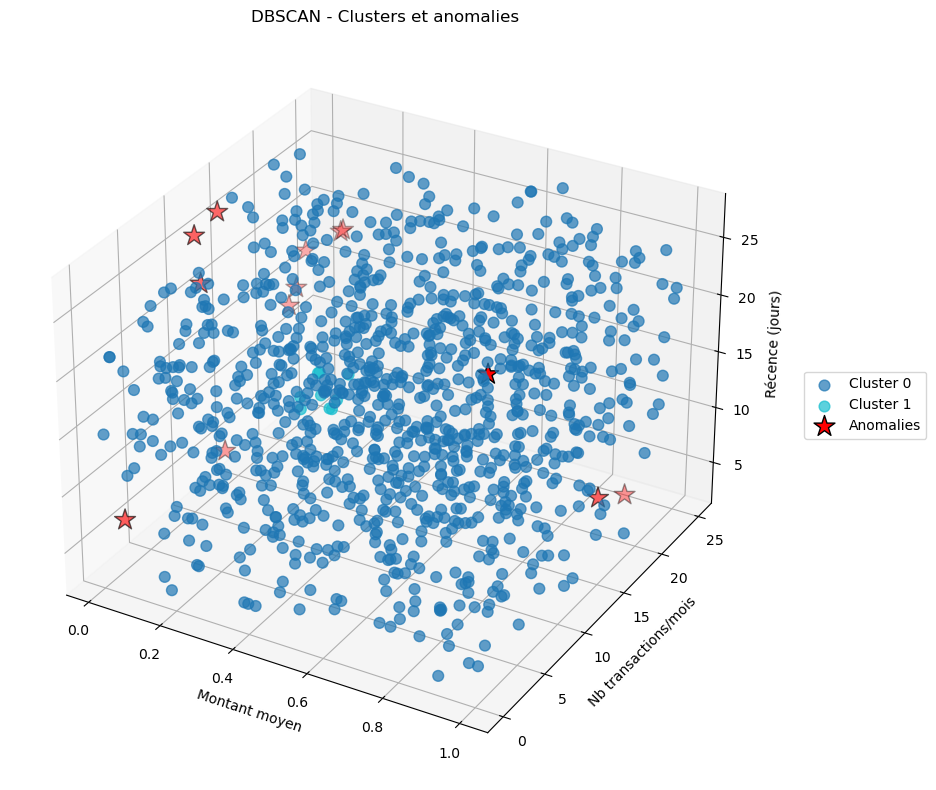

✅ Résultats sauvegardés dans resultats_dbscan_normalized.csv


In [61]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN

# ------------------------
# 1️⃣ Charger les données
# ------------------------
df = pd.read_csv("societaires.csv", encoding="latin1", sep=";")
cols_num = ["montant_moyen", "nb_transactions_mois", "dernière_transaction_jour"]
for col in cols_num:
    df[col] = pd.to_numeric(df[col], errors="coerce")
df = df.dropna(subset=cols_num)

X_raw = df[cols_num].values  # valeurs originales pour affichage
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_raw)  # normalisation pour DBSCAN

# ------------------------
# 2️⃣ Calculer la distance au kème voisin (sur données normalisées)
# ------------------------
min_samples = 5
neigh = NearestNeighbors(n_neighbors=min_samples)
nbrs = neigh.fit(X_scaled)
distances, indices = nbrs.kneighbors(X_scaled)
k_distances = np.sort(distances[:, -1])

plt.figure(figsize=(8,5))
plt.plot(k_distances)
plt.xlabel("Points triés")
plt.ylabel(f"Distance au {min_samples}-ème voisin")
plt.title("k-distance graph pour choisir eps de DBSCAN")
plt.grid(True)
plt.show()

# Choisir eps automatiquement à partir du 90ème percentile
eps_val = k_distances[int(len(k_distances)*0.9)]
print(f"Valeur eps suggérée : {eps_val:.2f}")

# ------------------------
# 3️⃣ Appliquer DBSCAN (sur données normalisées)
# ------------------------
dbscan = DBSCAN(eps=eps_val, min_samples=min_samples)
df["anomalie"] = dbscan.fit_predict(X_scaled)

# Nombre d'anomalies
outliers = df[df["anomalie"] == -1]
print("Nombre de clients anomalies détectés :", len(outliers))

# ------------------------
# 4️⃣ Visualisation 3D avec valeurs originales
# ------------------------
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111, projection='3d')

# Affichage des clusters
cluster_points = df[df["anomalie"] != -1]
num_clusters = len(cluster_points["anomalie"].unique())
colors = plt.cm.tab10(np.linspace(0, 1, num_clusters))

for cid, color in zip(sorted(cluster_points["anomalie"].unique()), colors):
    subset = df[df["anomalie"] == cid]
    ax.scatter(subset["montant_moyen"], 
               subset["nb_transactions_mois"], 
               subset["dernière_transaction_jour"], 
               c=[color], s=60, alpha=0.7, label=f"Cluster {cid}")

# Affichage des anomalies avec gros marqueur rouge
anomalies = df[df["anomalie"] == -1]
ax.scatter(anomalies["montant_moyen"], 
           anomalies["nb_transactions_mois"], 
           anomalies["dernière_transaction_jour"], 
           c="red", s=250, marker="*", edgecolor="k", label="Anomalies")

ax.set_xlabel("Montant moyen")
ax.set_ylabel("Nb transactions/mois")
ax.set_zlabel("Récence (jours)")
ax.set_title("DBSCAN - Clusters et anomalies")

ax.legend(loc='center left', bbox_to_anchor=(1.05, 0.5))
plt.tight_layout()
plt.show()

# ------------------------
# 5️⃣ Sauvegarde des résultats
# ------------------------
df.to_csv("resultats_dbscan_normalized.csv", index=False, encoding="utf-8")
print("✅ Résultats sauvegardés dans resultats_dbscan_normalized.csv")


 Nombre optimal de clusters selon silhouette : 14 (score=0.305)

Libellés assignés aux clusters :
- Cluster 0: Faible montant / faible activité / récent | centroïde = [montant=73373, tx/mois=6.2, récence_jours=11.0]
- Cluster 1: Premium dormants (haut montant, peu actifs, anciens) | centroïde = [montant=656059, tx/mois=5.1, récence_jours=23.4]
- Cluster 2: VIP (montant élevé, très actifs, récents) | centroïde = [montant=908256, tx/mois=22.2, récence_jours=4.8]
- Cluster 3: Moyen montant / élevé activité / ancien | centroïde = [montant=331490, tx/mois=20.7, récence_jours=20.7]
- Cluster 4: Moyen montant / faible activité / intermédiaire | centroïde = [montant=339858, tx/mois=5.6, récence_jours=16.6]
- Cluster 5: Faible montant / moyen activité / récent | centroïde = [montant=265839, tx/mois=13.8, récence_jours=7.2]
- Cluster 6: Élevé montant / élevé activité / ancien | centroïde = [montant=729013, tx/mois=23.5, récence_jours=26.5]
- Cluster 7: Élevé montant / faible activité / récent | 

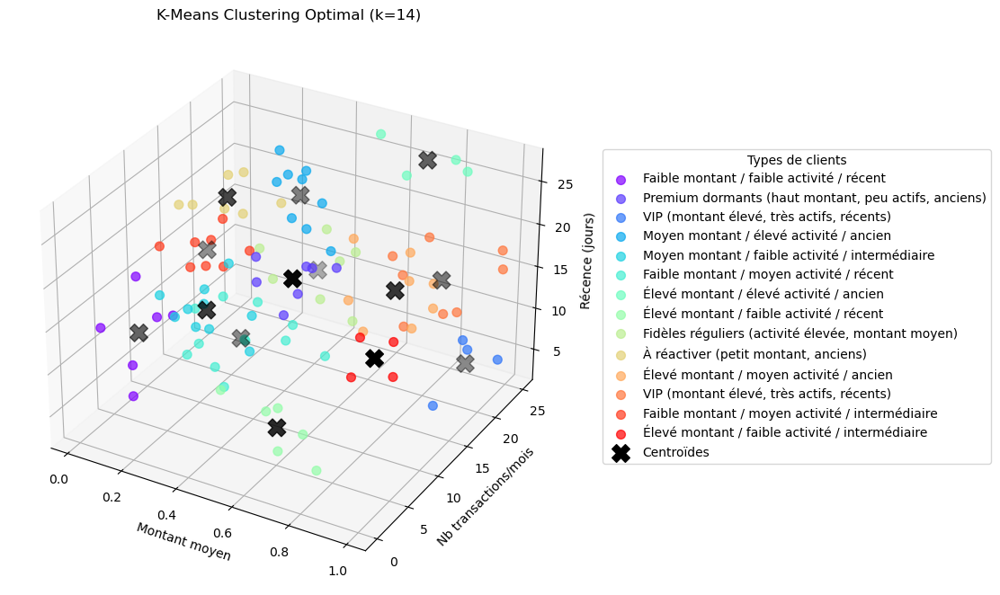

 Résultats sauvegardés dans resultats_kmeans_clusters_100.csv


In [71]:

# ------------------------
# 1. Chargement des données
# ------------------------
df = pd.read_csv("societaires_100.csv", encoding="latin1", sep=";")

cols_num = ["montant_moyen", "nb_transactions_mois", "dernière_transaction_jour"]
for col in cols_num:
    df[col] = pd.to_numeric(df[col], errors="coerce")

df = df.dropna(subset=cols_num)



# ------------------------
# 1️. Préparation des données
# ------------------------
X_raw = df[cols_num].values 
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_raw)  

# ------------------------
# 2️. Trouver le nombre optimal de clusters avec silhouette
# ------------------------
sil_scores = {}
best_score = -1
best_k = 2
best_model = None

for k in range(2, 15):
    kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
    labels = kmeans.fit_predict(X_scaled) 
    score = silhouette_score(X_scaled, labels)
    sil_scores[k] = score
    if score > best_score:
        best_score = score
        best_k = k
        best_model = kmeans

print(f" Nombre optimal de clusters selon silhouette : {best_k} (score={best_score:.3f})")

df["cluster"] = best_model.labels_

centroids_scaled = best_model.cluster_centers_
centroids = scaler.inverse_transform(centroids_scaled) 

# ------------------------
# 3️⃣ Nommer les clusters (version robuste)
# ------------------------

# Choisis la méthode: "data_terciles" (recommandée) ou "centroid_rank"
naming_method = "data_terciles"  # ou "centroid_rank"

centroids_df = pd.DataFrame(centroids, columns=cols_num)

def level_from_terciles(x, terciles):
    if x <= terciles[0]:
        return "faible"
    elif x <= terciles[1]:
        return "moyen"
    else:
        return "élevé"

def level_recence_from_terciles(x, terciles):
    # 'récent' = petit nombre de jours
    if x <= terciles[0]:
        return "récent"
    elif x <= terciles[1]:
        return "intermédiaire"
    else:
        return "ancien"

cluster_names = {}

if naming_method == "data_terciles":
    # Seuils calculés sur l'ensemble des données (plus stable)
    q_montant = np.quantile(df["montant_moyen"], [1/3, 2/3])
    q_freq    = np.quantile(df["nb_transactions_mois"], [1/3, 2/3])
    q_rec     = np.quantile(df["dernière_transaction_jour"], [1/3, 2/3])

    for cid, (montant, nb_tx, jour) in enumerate(centroids):
        lm = level_from_terciles(montant, q_montant)
        lf = level_from_terciles(nb_tx, q_freq)
        lr = level_recence_from_terciles(jour, q_rec)

        # Logique métier inchangée mais maintenant basée sur la distribution globale
        if lm == "élevé" and lf == "élevé" and lr != "ancien":
            name = "VIP (montant élevé, très actifs, récents)"
        elif lm == "élevé" and lf == "faible" and lr == "ancien":
            name = "Premium dormants (haut montant, peu actifs, anciens)"
        elif lm == "moyen" and lf == "élevé" and lr in ("récent", "intermédiaire"):
            name = "Fidèles réguliers (activité élevée, montant moyen)"
        elif lm == "faible" and lf == "élevé":
            name = "Petits mais actifs (faible montant, très actifs)"
        elif lm == "faible" and lr == "ancien":
            name = "À réactiver (petit montant, anciens)"
        else:
            name = f"{lm.capitalize()} montant / {lf} activité / {lr}"

        cluster_names[cid] = name

else:
    # Méthode alternative: classement des centroïdes (relative)
    k = len(centroids_df)
    if k < 3:
        # si k < 3, fallback sur terciles de la data (sécurité)
        print("k < 3 : fallback vers data_terciles")
        naming_method = "data_terciles"
        # (re-exécuter le bloc data_terciles — ici simplifié : on peut re-run le script)
    else:
        # ranks (dense) donnent 1..k ; on convertit en 0..k-1
        mont_rank = centroids_df["montant_moyen"].rank(method="dense").astype(int) - 1
        freq_rank = centroids_df["nb_transactions_mois"].rank(method="dense").astype(int) - 1
        rec_rank  = centroids_df["dernière_transaction_jour"].rank(method="dense").astype(int) - 1

        def rank_to_level(rank):
            # convertit rank (0..k-1) en 0/1/2 -> faible/moyen/élevé
            bucket = (rank * 3) // k
            if bucket <= 0: return "faible"
            elif bucket == 1: return "moyen"
            else: return "élevé"

        for cid in centroids_df.index:
            lm = rank_to_level(mont_rank.loc[cid])
            lf = rank_to_level(freq_rank.loc[cid])
            lr = rank_to_level(rec_rank.loc[cid])
            # pour la récence, transformons 'élevé'->'ancien', 'faible'->'récent' :
            lr_name = "récent" if lr == "faible" else ("intermédiaire" if lr == "moyen" else "ancien")

            if lm == "élevé" and lf == "élevé" and lr_name != "ancien":
                name = "VIP (montant élevé, très actifs, récents)"
            elif lm == "élevé" and lf == "faible" and lr_name == "ancien":
                name = "Premium dormants (haut montant, peu actifs, anciens)"
            elif lm == "moyen" and lf == "élevé" and lr_name in ("récent", "intermédiaire"):
                name = "Fidèles réguliers (activité élevée, montant moyen)"
            elif lm == "faible" and lf == "élevé":
                name = "Petits mais actifs (faible montant, très actifs)"
            elif lm == "faible" and lr_name == "ancien":
                name = "À réactiver (petit montant, anciens)"
            else:
                name = f"{lm.capitalize()} montant / {lf} activité / {lr_name}"

            cluster_names[cid] = name

# Appliquer les libellés
df["cluster_name"] = df["cluster"].map(cluster_names)

# Afficher un résumé pour contrôle manuel
print("\nLibellés assignés aux clusters :")
for cid, name in cluster_names.items():
    m,f,r = centroids[cid]
    print(f"- Cluster {cid}: {name} | centroïde = [montant={m:.0f}, tx/mois={f:.1f}, récence_jours={r:.1f}]")

summary = df.groupby(["cluster","cluster_name"])[cols_num].agg(['mean','median','count'])
print("\nSynthèse par cluster (mean/median/count) :\n", summary)


# ------------------------
# 4️. Visualisation en 3D avec valeurs originales
# ------------------------
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')

colors = plt.cm.rainbow(np.linspace(0, 1, best_k))

for cid, color in zip(range(best_k), colors):
    subset = df[df["cluster"] == cid]
    ax.scatter(subset["montant_moyen"], 
               subset["nb_transactions_mois"], 
               subset["dernière_transaction_jour"], 
               c=[color], s=50, alpha=0.7, 
               label=cluster_names[cid])

# Ajout des centroïdes (dans l'échelle originale)
ax.scatter(centroids[:,0], centroids[:,1], centroids[:,2], 
           c="black", marker="X", s=200, label="Centroïdes")

ax.set_xlabel("Montant moyen")
ax.set_ylabel("Nb transactions/mois")
ax.set_zlabel("Récence (jours)")
ax.set_title(f"K-Means Clustering Optimal (k={best_k})")
ax.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title="Types de clients")

plt.tight_layout()
plt.show()

df["cluster_display"] = df["cluster_name"]

fig = px.scatter_3d(
    df,
    x="montant_moyen",
    y="nb_transactions_mois",
    z="dernière_transaction_jour",
    color="cluster_display",          
    symbol="cluster_display",        
    hover_data={
        "montant_moyen": True,
        "nb_transactions_mois": True,
        "dernière_transaction_jour": True,
        "cluster_name": True
    },
    size_max=10,
    opacity=0.8
)

# Ajout des centroïdes (grands X noirs)
centroids_df_plot = pd.DataFrame(centroids, columns=cols_num)
centroids_df_plot["cluster_display"] = "Centroïde"

fig.add_scatter3d(
    x=centroids_df_plot["montant_moyen"],
    y=centroids_df_plot["nb_transactions_mois"],
    z=centroids_df_plot["dernière_transaction_jour"],
    mode='markers',
    marker=dict(size=10, color='black', symbol='x'),
    name='Centroïdes'
)

fig.update_layout(
    title=f"K-Means Clustering Optimal (k={best_k}) - Interactif",
    legend_title_text="Type de clients",
    scene=dict(
        xaxis_title='Montant moyen',
        yaxis_title='Nb transactions/mois',
        zaxis_title='Récence (jours)'
    )
)

fig.show()

# ------------------------
# 5️. Sauvegarde des résultats dans un CSV
# ------------------------

if "cluster_display" in df.columns:
    df = df.drop(columns=["cluster_display"])

output_file = "resultats_kmeans_clusters_100.csv"
df.to_csv(output_file, index=False, encoding="utf-8")
print(f" Résultats sauvegardés dans {output_file}")

 Nombre optimal de clusters selon silhouette : 6 (score=0.291)

Libellés assignés aux clusters :
- Cluster 0: Élevé montant / élevé activité / ancien | centroïde = [montant=795645, tx/mois=18.8, récence_jours=20.0]
- Cluster 1: Moyen montant / faible activité / ancien | centroïde = [montant=620637, tx/mois=4.6, récence_jours=21.6]
- Cluster 2: Élevé montant / moyen activité / récent | centroïde = [montant=781533, tx/mois=8.1, récence_jours=8.6]
- Cluster 3: Faible montant / faible activité / intermédiaire | centroïde = [montant=233725, tx/mois=6.0, récence_jours=11.1]
- Cluster 4: Fidèles réguliers (activité élevée, montant moyen) | centroïde = [montant=401636, tx/mois=19.9, récence_jours=8.3]
- Cluster 5: Petits mais actifs (faible montant, très actifs) | centroïde = [montant=252805, tx/mois=16.1, récence_jours=21.6]

Synthèse par cluster (mean/median/count) :
                                                             montant_moyen  \
                                                

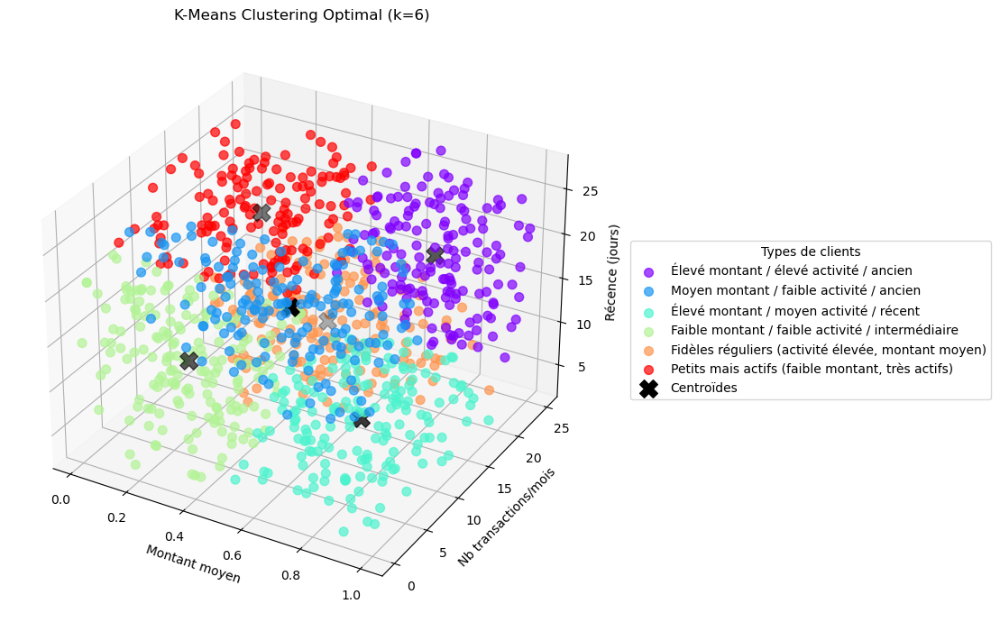

✅ Résultats sauvegardés dans resultats_kmeans_clusters.csv


In [72]:
# ------------------------
# 1. Chargement des données
# ------------------------
df = pd.read_csv("societaires.csv", encoding="latin1", sep=";")

cols_num = ["montant_moyen", "nb_transactions_mois", "dernière_transaction_jour"]
for col in cols_num:
    df[col] = pd.to_numeric(df[col], errors="coerce")

df = df.dropna(subset=cols_num)

from sklearn.preprocessing import StandardScaler

# ------------------------
# 1️. Préparation des données
# ------------------------
X_raw = df[cols_num].values  
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_raw)  

# ------------------------
# 2️. nombre optimal de clusters avec silhouette
# ------------------------
sil_scores = {}
best_score = -1
best_k = 2
best_model = None

for k in range(2, 16):
    kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
    labels = kmeans.fit_predict(X_scaled) 
    score = silhouette_score(X_scaled, labels)
    sil_scores[k] = score
    if score > best_score:
        best_score = score
        best_k = k
        best_model = kmeans

print(f" Nombre optimal de clusters selon silhouette : {best_k} (score={best_score:.3f})")

df["cluster"] = best_model.labels_

# Pour les centroïdes, on les remet dans l'échelle originale pour affichage
centroids_scaled = best_model.cluster_centers_
centroids = scaler.inverse_transform(centroids_scaled) 

# ------------------------
# 3️⃣ Nommer les clusters (version robuste)
# ------------------------

# Choisis la méthode: "data_terciles" (recommandée) ou "centroid_rank"
naming_method = "data_terciles"  # ou "centroid_rank"

centroids_df = pd.DataFrame(centroids, columns=cols_num)

def level_from_terciles(x, terciles):
    if x <= terciles[0]:
        return "faible"
    elif x <= terciles[1]:
        return "moyen"
    else:
        return "élevé"

def level_recence_from_terciles(x, terciles):
    # 'récent' = petit nombre de jours
    if x <= terciles[0]:
        return "récent"
    elif x <= terciles[1]:
        return "intermédiaire"
    else:
        return "ancien"

cluster_names = {}

if naming_method == "data_terciles":
    # Seuils calculés sur l'ensemble des données (plus stable)
    q_montant = np.quantile(df["montant_moyen"], [1/3, 2/3])
    q_freq    = np.quantile(df["nb_transactions_mois"], [1/3, 2/3])
    q_rec     = np.quantile(df["dernière_transaction_jour"], [1/3, 2/3])

    for cid, (montant, nb_tx, jour) in enumerate(centroids):
        lm = level_from_terciles(montant, q_montant)
        lf = level_from_terciles(nb_tx, q_freq)
        lr = level_recence_from_terciles(jour, q_rec)

        # Logique métier inchangée mais maintenant basée sur la distribution globale
        if lm == "élevé" and lf == "élevé" and lr != "ancien":
            name = "VIP (montant élevé, très actifs, récents)"
        elif lm == "élevé" and lf == "faible" and lr == "ancien":
            name = "Premium dormants (haut montant, peu actifs, anciens)"
        elif lm == "moyen" and lf == "élevé" and lr in ("récent", "intermédiaire"):
            name = "Fidèles réguliers (activité élevée, montant moyen)"
        elif lm == "faible" and lf == "élevé":
            name = "Petits mais actifs (faible montant, très actifs)"
        elif lm == "faible" and lr == "ancien":
            name = "À réactiver (petit montant, anciens)"
        else:
            name = f"{lm.capitalize()} montant / {lf} activité / {lr}"

        cluster_names[cid] = name

else:
    # Méthode alternative: classement des centroïdes (relative)
    k = len(centroids_df)
    if k < 3:
        # si k < 3, fallback sur terciles de la data (sécurité)
        print("k < 3 : fallback vers data_terciles")
        naming_method = "data_terciles"
        # (re-exécuter le bloc data_terciles — ici simplifié : on peut re-run le script)
    else:
        # ranks (dense) donnent 1..k ; on convertit en 0..k-1
        mont_rank = centroids_df["montant_moyen"].rank(method="dense").astype(int) - 1
        freq_rank = centroids_df["nb_transactions_mois"].rank(method="dense").astype(int) - 1
        rec_rank  = centroids_df["dernière_transaction_jour"].rank(method="dense").astype(int) - 1

        def rank_to_level(rank):
            # convertit rank (0..k-1) en 0/1/2 -> faible/moyen/élevé
            bucket = (rank * 3) // k
            if bucket <= 0: return "faible"
            elif bucket == 1: return "moyen"
            else: return "élevé"

        for cid in centroids_df.index:
            lm = rank_to_level(mont_rank.loc[cid])
            lf = rank_to_level(freq_rank.loc[cid])
            lr = rank_to_level(rec_rank.loc[cid])
            # pour la récence, transformons 'élevé'->'ancien', 'faible'->'récent' :
            lr_name = "récent" if lr == "faible" else ("intermédiaire" if lr == "moyen" else "ancien")

            if lm == "élevé" and lf == "élevé" and lr_name != "ancien":
                name = "VIP (montant élevé, très actifs, récents)"
            elif lm == "élevé" and lf == "faible" and lr_name == "ancien":
                name = "Premium dormants (haut montant, peu actifs, anciens)"
            elif lm == "moyen" and lf == "élevé" and lr_name in ("récent", "intermédiaire"):
                name = "Fidèles réguliers (activité élevée, montant moyen)"
            elif lm == "faible" and lf == "élevé":
                name = "Petits mais actifs (faible montant, très actifs)"
            elif lm == "faible" and lr_name == "ancien":
                name = "À réactiver (petit montant, anciens)"
            else:
                name = f"{lm.capitalize()} montant / {lf} activité / {lr_name}"

            cluster_names[cid] = name

# Appliquer les libellés
df["cluster_name"] = df["cluster"].map(cluster_names)

# Afficher un résumé pour contrôle manuel
print("\nLibellés assignés aux clusters :")
for cid, name in cluster_names.items():
    m,f,r = centroids[cid]
    print(f"- Cluster {cid}: {name} | centroïde = [montant={m:.0f}, tx/mois={f:.1f}, récence_jours={r:.1f}]")

summary = df.groupby(["cluster","cluster_name"])[cols_num].agg(['mean','median','count'])
print("\nSynthèse par cluster (mean/median/count) :\n", summary)


# ------------------------
# 4️. Visualisation 3D avec valeurs originales
# ------------------------
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')

colors = plt.cm.rainbow(np.linspace(0, 1, best_k))

for cid, color in zip(range(best_k), colors):
    subset = df[df["cluster"] == cid]
    ax.scatter(subset["montant_moyen"], 
               subset["nb_transactions_mois"], 
               subset["dernière_transaction_jour"], 
               c=[color], s=50, alpha=0.7, 
               label=cluster_names[cid])

# Ajout des centroïdes (dans l'échelle originale)
ax.scatter(centroids[:,0], centroids[:,1], centroids[:,2], 
           c="black", marker="X", s=200, label="Centroïdes")

ax.set_xlabel("Montant moyen")
ax.set_ylabel("Nb transactions/mois")
ax.set_zlabel("Récence (jours)")
ax.set_title(f"K-Means Clustering Optimal (k={best_k})")
ax.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title="Types de clients")

plt.tight_layout()
plt.show()

# Colonne pour l'affichage du cluster
df["cluster_display"] = df["cluster_name"]

fig = px.scatter_3d(
    df,
    x="montant_moyen",
    y="nb_transactions_mois",
    z="dernière_transaction_jour",
    color="cluster_display",          
    symbol="cluster_display",         
    hover_data={
        "montant_moyen": True,
        "nb_transactions_mois": True,
        "dernière_transaction_jour": True,
        "cluster_name": True
    },
    size_max=10,
    opacity=0.8
)

# Ajout des centroïdes (grands X noirs)
centroids_df_plot = pd.DataFrame(centroids, columns=cols_num)
centroids_df_plot["cluster_display"] = "Centroïde"

fig.add_scatter3d(
    x=centroids_df_plot["montant_moyen"],
    y=centroids_df_plot["nb_transactions_mois"],
    z=centroids_df_plot["dernière_transaction_jour"],
    mode='markers',
    marker=dict(size=10, color='black', symbol='x'),
    name='Centroïdes'
)

fig.update_layout(
    title=f"K-Means Clustering Optimal (k={best_k}) - Interactif",
    legend_title_text="Type de clients",
    scene=dict(
        xaxis_title='Montant moyen',
        yaxis_title='Nb transactions/mois',
        zaxis_title='Récence (jours)'
    )
)

fig.show()

# ------------------------
# 5️. Sauvegarde des résultats dans un CSV
# ------------------------
if "cluster_display" in df.columns:
    df = df.drop(columns=["cluster_display"])

output_file = "resultats_kmeans_clusters.csv"
df.to_csv(output_file, index=False, encoding="utf-8")
print(f"✅ Résultats sauvegardés dans {output_file}")


✅ Nombre total de clusters détectés : 22

Liste des clusters et effectifs :
1. Faible montant / faible activité / intermédiaire (46 clients)
2. Faible montant / faible activité / récent (34 clients)
3. Faible montant / moyen activité / intermédiaire (24 clients)
4. Faible montant / moyen activité / récent (41 clients)
5. Fidèles réguliers (activité élevée, montant moyen) (69 clients)
6. Moyen montant / faible activité / ancien (55 clients)
7. Moyen montant / faible activité / intermédiaire (33 clients)
8. Moyen montant / faible activité / récent (44 clients)
9. Moyen montant / moyen activité / ancien (25 clients)
10. Moyen montant / moyen activité / intermédiaire (37 clients)
11. Moyen montant / moyen activité / récent (37 clients)
12. Moyen montant / élevé activité / ancien (33 clients)
13. Petits mais actifs (faible montant, très actifs) (120 clients)
14. Premium dormants (haut montant, peu actifs, anciens) (30 clients)
15. VIP (montant élevé, très actifs, récents) (64 clients)
16. 

/var/folders/4c/fh9xd7z13n95s2n9x83k0j640000gn/T/ipykernel_13184/1667483473.py:87: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



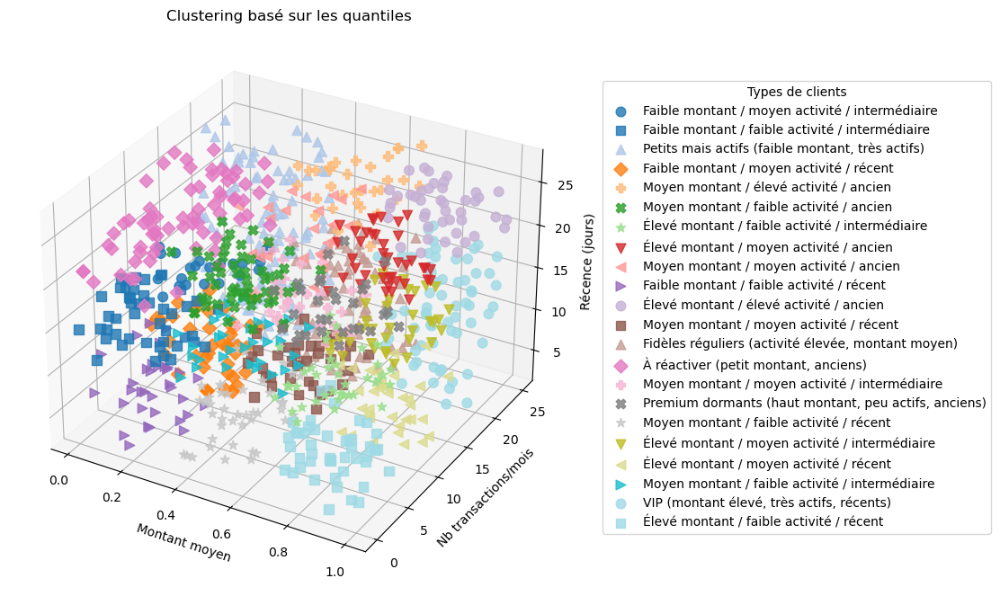


✅ Résultats sauvegardés dans resultats_clusters_quantiles.csv (colonnes nettoyées)


In [76]:
# ------------------------
# 1. Chargement des données
# ------------------------
df = pd.read_csv("societaires.csv", encoding="latin1", sep=";")

cols_num = ["montant_moyen", "nb_transactions_mois", "dernière_transaction_jour"]
for col in cols_num:
    df[col] = pd.to_numeric(df[col], errors="coerce")

df = df.dropna(subset=cols_num)

# ------------------------
# 2. Définir les quantiles (seuils globaux)
# ------------------------
q_montant = np.quantile(df["montant_moyen"], [1/3, 2/3])
q_freq    = np.quantile(df["nb_transactions_mois"], [1/3, 2/3])
q_rec     = np.quantile(df["dernière_transaction_jour"], [1/3, 2/3])

def level_from_terciles(x, terciles):
    if x <= terciles[0]:
        return "faible"
    elif x <= terciles[1]:
        return "moyen"
    else:
        return "élevé"

def level_recence_from_terciles(x, terciles):
    if x <= terciles[0]:
        return "récent"
    elif x <= terciles[1]:
        return "intermédiaire"
    else:
        return "ancien"

# ------------------------
# 3. Attribuer une catégorie à chaque client
# ------------------------
df["montant_cat"] = df["montant_moyen"].apply(lambda x: level_from_terciles(x, q_montant))
df["freq_cat"]    = df["nb_transactions_mois"].apply(lambda x: level_from_terciles(x, q_freq))
df["rec_cat"]     = df["dernière_transaction_jour"].apply(lambda x: level_recence_from_terciles(x, q_rec))

# ------------------------
# 4. Règles métier pour nommer les clusters
# ------------------------
def assign_cluster_name(montant, freq, rec):
    if montant == "élevé" and freq == "élevé" and rec != "ancien":
        return "VIP (montant élevé, très actifs, récents)"
    elif montant == "élevé" and freq == "faible" and rec == "ancien":
        return "Premium dormants (haut montant, peu actifs, anciens)"
    elif montant == "moyen" and freq == "élevé" and rec in ("récent", "intermédiaire"):
        return "Fidèles réguliers (activité élevée, montant moyen)"
    elif montant == "faible" and freq == "élevé":
        return "Petits mais actifs (faible montant, très actifs)"
    elif montant == "faible" and rec == "ancien":
        return "À réactiver (petit montant, anciens)"
    else:
        return f"{montant.capitalize()} montant / {freq} activité / {rec}"

df["cluster_name"] = df.apply(lambda row: assign_cluster_name(row["montant_cat"], row["freq_cat"], row["rec_cat"]), axis=1)

# ------------------------
# 5. Numéro de cluster unique (facultatif pour les graphiques)
# ------------------------
df["cluster"] = df["cluster_name"].astype("category").cat.codes

# ------------------------
# 6. Résumé
# ------------------------
summary = df.groupby("cluster_name")[cols_num].agg(['mean','median','count'])

# Nombre de clusters distincts
n_clusters = df["cluster_name"].nunique()
print(f"\n✅ Nombre total de clusters détectés : {n_clusters}\n")

print("Liste des clusters et effectifs :")
for i, (name, subset) in enumerate(df.groupby("cluster_name"), 1):
    print(f"{i}. {name} ({len(subset)} clients)")

# ------------------------
# 7. Visualisation 3D (Matplotlib)
# ------------------------
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')

# Palette étendue
from matplotlib.cm import get_cmap
cmap = get_cmap("tab20", df["cluster"].nunique())  

# Symboles variés
markers = ["o", "s", "^", "D", "P", "X", "*", "v", "<", ">"]

for i, cid in enumerate(df["cluster"].unique()):
    subset = df[df["cluster"] == cid]
    ax.scatter(
        subset["montant_moyen"], 
        subset["nb_transactions_mois"], 
        subset["dernière_transaction_jour"], 
        c=[cmap(i)], 
        s=60, 
        alpha=0.8, 
        marker=markers[i % len(markers)], 
        label=subset["cluster_name"].iloc[0]
    )

ax.set_xlabel("Montant moyen")
ax.set_ylabel("Nb transactions/mois")
ax.set_zlabel("Récence (jours)")
ax.set_title("Clustering basé sur les quantiles")
ax.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title="Types de clients")

plt.tight_layout()
plt.show()


# ------------------------
# Visualisation 3D (Plotly - Interactif)
# ------------------------
# Palette plus variée
palette = px.colors.qualitative.Set3 + px.colors.qualitative.Safe + px.colors.qualitative.Bold

# Colonne pour affichage
df["cluster_display"] = df["cluster_name"]

fig = px.scatter_3d(
    df,
    x="montant_moyen",
    y="nb_transactions_mois",
    z="dernière_transaction_jour",
    color="cluster_display",
    symbol="cluster_display",   # forme différente par cluster
    color_discrete_sequence=palette,
    hover_data={
        "montant_moyen": True,
        "nb_transactions_mois": True,
        "dernière_transaction_jour": True,
        "cluster_name": True
    },
    size_max=12,
    opacity=0.85
)

fig.update_layout(
    title="Clustering basé sur les quantiles - Interactif",
    legend_title_text="Type de clients",
    scene=dict(
        xaxis_title='Montant moyen',
        yaxis_title='Nb transactions/mois',
        zaxis_title='Récence (jours)'
    )
)

fig.show()


# ------------------------
# 8. Export
# ------------------------
# Colonnes de base (comme dans le fichier d'origine)
base_cols = [col for col in df.columns if col in ["montant_moyen", "nb_transactions_mois", "dernière_transaction_jour"] or col not in ["montant_cat", "freq_cat", "rec_cat", "cluster_display"]]

# On garde seulement les colonnes d'origine + cluster + cluster_name
export_cols = [c for c in df.columns if c not in ["montant_cat", "freq_cat", "rec_cat", "cluster_display"]]

output_file = "resultats_clusters_quantiles.csv"
df[export_cols].to_csv(output_file, index=False, encoding="utf-8")
print(f"\n✅ Résultats sauvegardés dans {output_file} (colonnes nettoyées)")


Colonnes disponibles dans le CSV :
['client_id', 'montant_moyen', 'derniÃ¨re_transaction', 'nb_transactions_mois', 'derniÃ¨re_transaction_jour']


/var/folders/4c/fh9xd7z13n95s2n9x83k0j640000gn/T/ipykernel_13184/1779998968.py:19: UserWarning:

Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.




✅ Nombre total de clusters détectés : 22

Liste des clusters et effectifs :
1. Faible montant / faible activité / intermédiaire (926 clients)
2. Faible montant / faible activité / récent (1424 clients)
3. Faible montant / moyen activité / intermédiaire (849 clients)
4. Faible montant / moyen activité / récent (1353 clients)
5. Fidèles réguliers (activité élevée, montant moyen) (4241 clients)
6. Moyen montant / faible activité / ancien (1813 clients)
7. Moyen montant / faible activité / intermédiaire (1383 clients)
8. Moyen montant / faible activité / récent (851 clients)
9. Moyen montant / moyen activité / ancien (1062 clients)
10. Moyen montant / moyen activité / intermédiaire (1558 clients)
11. Moyen montant / moyen activité / récent (1500 clients)
12. Moyen montant / élevé activité / ancien (434 clients)
13. Petits mais actifs (faible montant, très actifs) (4988 clients)
14. Premium dormants (haut montant, peu actifs, anciens) (2991 clients)
15. VIP (montant élevé, très actifs, réc

/var/folders/4c/fh9xd7z13n95s2n9x83k0j640000gn/T/ipykernel_13184/1779998968.py:107: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



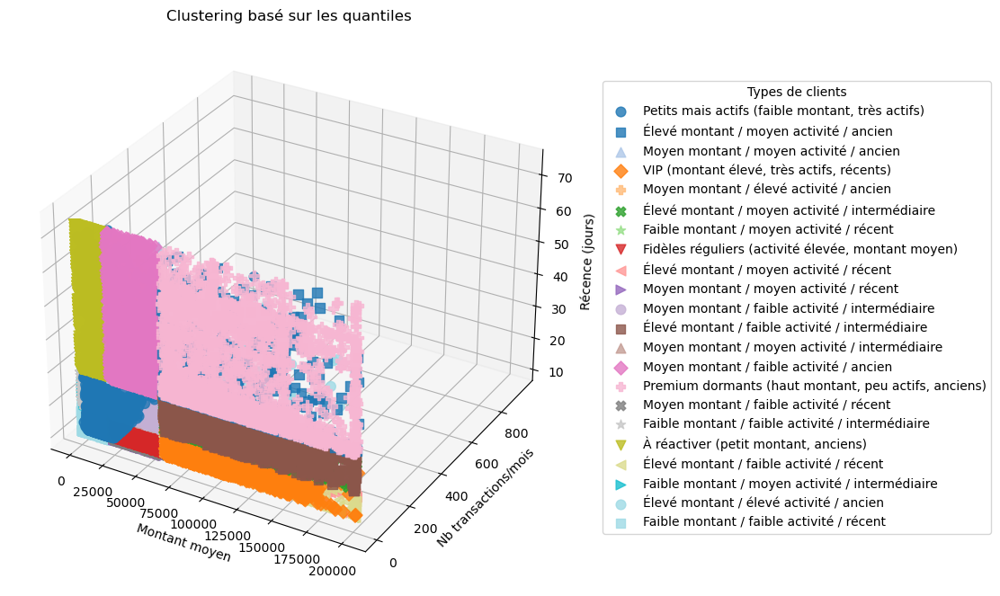


✅ Résultats sauvegardés dans resultats_bases_reelles_fin.csv (colonnes nettoyées)


In [84]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from datetime import datetime


# 1. Chargement des données

df = pd.read_csv("bases_reelles_fin.csv", encoding="latin1", sep=";")

print("\nColonnes disponibles dans le CSV :")
print(df.columns.tolist())

df = df.rename(columns={"derniÃ¨re_transaction": "derniere_transaction"})
df = df.rename(columns={"derniÃ¨re_transaction_jour": "derniere_transaction_jour"})

# Conversion de la date
df["derniere_transaction"] = pd.to_datetime(df["derniere_transaction"], errors="coerce")

# Calcul de la récence (jours depuis la dernière transaction)
today = pd.Timestamp.today().normalize()
df["derniere_transaction_jour"] = (today - df["derniere_transaction"]).dt.days

# Colonnes numériques à traiter
cols_num = ["montant_moyen", "nb_transactions_mois", "derniere_transaction_jour"]
for col in cols_num:
    df[col] = pd.to_numeric(df[col], errors="coerce")

df = df.dropna(subset=cols_num)

# ------------------------
# 2. Définir les quantiles (seuils globaux)
# ------------------------
q_montant = np.quantile(df["montant_moyen"], [1/3, 2/3])
q_freq    = np.quantile(df["nb_transactions_mois"], [1/3, 2/3])
q_rec     = np.quantile(df["derniere_transaction_jour"], [1/3, 2/3])

def level_from_terciles(x, terciles):
    if x <= terciles[0]:
        return "faible"
    elif x <= terciles[1]:
        return "moyen"
    else:
        return "élevé"

def level_recence_from_terciles(x, terciles):
    if x <= terciles[0]:
        return "récent"
    elif x <= terciles[1]:
        return "intermédiaire"
    else:
        return "ancien"

# ------------------------
# 3. Attribuer une catégorie à chaque client
# ------------------------
df["montant_cat"] = df["montant_moyen"].apply(lambda x: level_from_terciles(x, q_montant))
df["freq_cat"]    = df["nb_transactions_mois"].apply(lambda x: level_from_terciles(x, q_freq))
df["rec_cat"]     = df["derniere_transaction_jour"].apply(lambda x: level_recence_from_terciles(x, q_rec))

# ------------------------
# 4. Règles métier pour nommer les clusters
# ------------------------
def assign_cluster_name(montant, freq, rec):
    if montant == "élevé" and freq == "élevé" and rec != "ancien":
        return "VIP (montant élevé, très actifs, récents)"
    elif montant == "élevé" and freq == "faible" and rec == "ancien":
        return "Premium dormants (haut montant, peu actifs, anciens)"
    elif montant == "moyen" and freq == "élevé" and rec in ("récent", "intermédiaire"):
        return "Fidèles réguliers (activité élevée, montant moyen)"
    elif montant == "faible" and freq == "élevé":
        return "Petits mais actifs (faible montant, très actifs)"
    elif montant == "faible" and rec == "ancien":
        return "À réactiver (petit montant, anciens)"
    else:
        return f"{montant.capitalize()} montant / {freq} activité / {rec}"

df["cluster_name"] = df.apply(lambda row: assign_cluster_name(row["montant_cat"], row["freq_cat"], row["rec_cat"]), axis=1)

# ------------------------
# 5. Numéro de cluster unique (facultatif pour les graphiques)
# ------------------------
df["cluster"] = df["cluster_name"].astype("category").cat.codes

# ------------------------
# 6. Résumé
# ------------------------
summary = df.groupby("cluster_name")[cols_num].agg(['mean','median','count'])

# Nombre de clusters distincts
n_clusters = df["cluster_name"].nunique()
print(f"\n✅ Nombre total de clusters détectés : {n_clusters}\n")

print("Liste des clusters et effectifs :")
for i, (name, subset) in enumerate(df.groupby("cluster_name"), 1):
    print(f"{i}. {name} ({len(subset)} clients)")

# ------------------------
# 7. Visualisation 3D (Matplotlib)
# ------------------------
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')

# Palette étendue
from matplotlib.cm import get_cmap
cmap = get_cmap("tab20", df["cluster"].nunique())  

# Symboles variés
markers = ["o", "s", "^", "D", "P", "X", "*", "v", "<", ">"]

for i, cid in enumerate(df["cluster"].unique()):
    subset = df[df["cluster"] == cid]
    ax.scatter(
        subset["montant_moyen"], 
        subset["nb_transactions_mois"], 
        subset["derniere_transaction_jour"], 
        c=[cmap(i)], 
        s=60, 
        alpha=0.8, 
        marker=markers[i % len(markers)], 
        label=subset["cluster_name"].iloc[0]
    )

ax.set_xlabel("Montant moyen")
ax.set_ylabel("Nb transactions/mois")
ax.set_zlabel("Récence (jours)")
ax.set_title("Clustering basé sur les quantiles")
ax.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title="Types de clients")

plt.tight_layout()
plt.show()

# ------------------------
# Visualisation 3D (Plotly - Interactif)
# ------------------------
palette = px.colors.qualitative.Set3 + px.colors.qualitative.Safe + px.colors.qualitative.Bold

df["cluster_display"] = df["cluster_name"]

fig = px.scatter_3d(
    df,
    x="montant_moyen",
    y="nb_transactions_mois",
    z="derniere_transaction_jour",
    color="cluster_display",
    symbol="cluster_display",   # forme différente par cluster
    color_discrete_sequence=palette,
    hover_data={
        "montant_moyen": True,
        "nb_transactions_mois": True,
        "derniere_transaction_jour": True,
        "cluster_name": True
    },
    size_max=12,
    opacity=0.85
)

fig.update_layout(
    title="Clustering basé sur les quantiles - Interactif",
    legend_title_text="Type de clients",
    scene=dict(
        xaxis_title='Montant moyen',
        yaxis_title='Nb transactions/mois',
        zaxis_title='Récence (jours)'
    )
)

fig.show()

# ------------------------
# 8. Export
# ------------------------
export_cols = [c for c in df.columns if c not in ["montant_cat", "freq_cat", "rec_cat", "cluster_display"]]
output_file = "resultats_bases_reelles_fin.csv"
df[export_cols].to_csv(output_file, index=False, encoding="utf-8", sep=";")

print(f"\n✅ Résultats sauvegardés dans {output_file} (colonnes nettoyées)")



Colonnes disponibles dans le CSV :
['client_id', 'montant_moyen', 'derniÃ¨re_transaction', 'nb_transactions_mois', 'derniÃ¨re_transaction_jour']
✅ Transactions filtrées : 38527 lignes conservées (00h-06h uniquement)


/var/folders/4c/fh9xd7z13n95s2n9x83k0j640000gn/T/ipykernel_13184/16207690.py:19: UserWarning:

Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.




✅ Nombre total de clusters détectés : 22

Liste des clusters et effectifs :
1. Faible montant / faible activité / intermédiaire (926 clients)
2. Faible montant / faible activité / récent (1424 clients)
3. Faible montant / moyen activité / intermédiaire (849 clients)
4. Faible montant / moyen activité / récent (1353 clients)
5. Fidèles réguliers (activité élevée, montant moyen) (4241 clients)
6. Moyen montant / faible activité / ancien (1813 clients)
7. Moyen montant / faible activité / intermédiaire (1383 clients)
8. Moyen montant / faible activité / récent (851 clients)
9. Moyen montant / moyen activité / ancien (1062 clients)
10. Moyen montant / moyen activité / intermédiaire (1558 clients)
11. Moyen montant / moyen activité / récent (1500 clients)
12. Moyen montant / élevé activité / ancien (434 clients)
13. Petits mais actifs (faible montant, très actifs) (4988 clients)
14. Premium dormants (haut montant, peu actifs, anciens) (2991 clients)
15. VIP (montant élevé, très actifs, réc

/var/folders/4c/fh9xd7z13n95s2n9x83k0j640000gn/T/ipykernel_13184/16207690.py:112: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



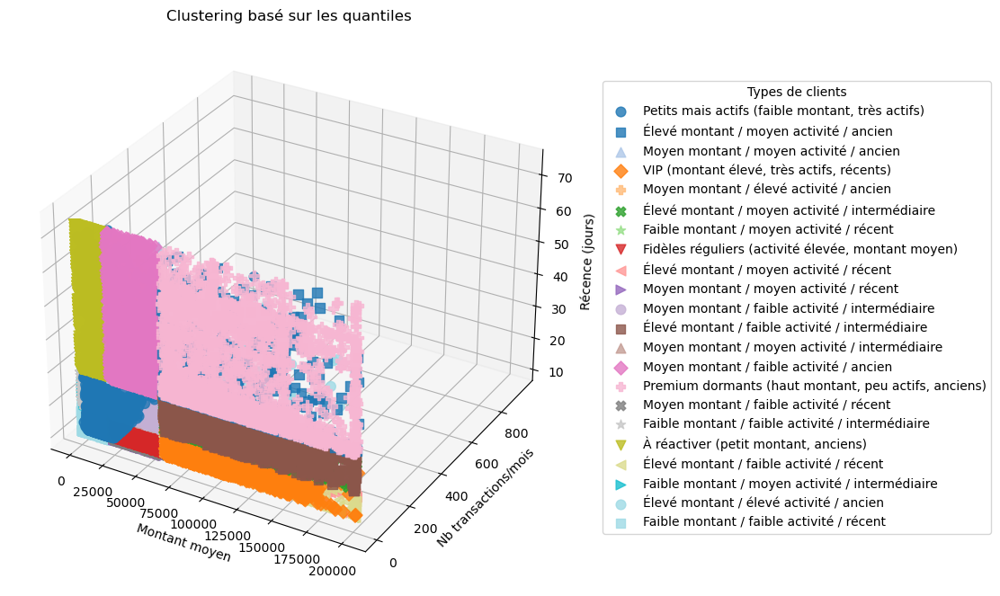


✅ Résultats sauvegardés dans resultats_bases_reelles_fin_bis.csv (colonnes nettoyées)


In [87]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from datetime import datetime

# ------------------------
# 1. Chargement des données
# ------------------------
df = pd.read_csv("bases_reelles_fin.csv", encoding="latin1", sep=";")

print("\nColonnes disponibles dans le CSV :")
print(df.columns.tolist())

df = df.rename(columns={"derniÃ¨re_transaction": "derniere_transaction"})
df = df.rename(columns={"derniÃ¨re_transaction_jour": "derniere_transaction_jour"})

# Conversion de la date
df["derniere_transaction"] = pd.to_datetime(df["derniere_transaction"], errors="coerce")

# 🌙 Ne garder que les transactions entre 00:00 et 06:00
df = df[df["derniere_transaction"].dt.hour.between(0, 6)]

print(f"✅ Transactions filtrées : {len(df)} lignes conservées (00h-06h uniquement)")

# Calcul de la récence (jours depuis la dernière transaction)
today = pd.Timestamp.today().normalize()
df["derniere_transaction_jour"] = (today - df["derniere_transaction"]).dt.days

# Colonnes numériques à traiter
cols_num = ["montant_moyen", "nb_transactions_mois", "derniere_transaction_jour"]
for col in cols_num:
    df[col] = pd.to_numeric(df[col], errors="coerce")

df = df.dropna(subset=cols_num)

# ------------------------
# 2. Définir les quantiles (seuils globaux)
# ------------------------
q_montant = np.quantile(df["montant_moyen"], [1/3, 2/3])
q_freq    = np.quantile(df["nb_transactions_mois"], [1/3, 2/3])
q_rec     = np.quantile(df["derniere_transaction_jour"], [1/3, 2/3])

def level_from_terciles(x, terciles):
    if x <= terciles[0]:
        return "faible"
    elif x <= terciles[1]:
        return "moyen"
    else:
        return "élevé"

def level_recence_from_terciles(x, terciles):
    if x <= terciles[0]:
        return "récent"
    elif x <= terciles[1]:
        return "intermédiaire"
    else:
        return "ancien"

# ------------------------
# 3. Attribuer une catégorie à chaque client
# ------------------------
df["montant_cat"] = df["montant_moyen"].apply(lambda x: level_from_terciles(x, q_montant))
df["freq_cat"]    = df["nb_transactions_mois"].apply(lambda x: level_from_terciles(x, q_freq))
df["rec_cat"]     = df["derniere_transaction_jour"].apply(lambda x: level_recence_from_terciles(x, q_rec))

# ------------------------
# 4. Règles métier pour nommer les clusters
# ------------------------
def assign_cluster_name(montant, freq, rec):
    if montant == "élevé" and freq == "élevé" and rec != "ancien":
        return "VIP (montant élevé, très actifs, récents)"
    elif montant == "élevé" and freq == "faible" and rec == "ancien":
        return "Premium dormants (haut montant, peu actifs, anciens)"
    elif montant == "moyen" and freq == "élevé" and rec in ("récent", "intermédiaire"):
        return "Fidèles réguliers (activité élevée, montant moyen)"
    elif montant == "faible" and freq == "élevé":
        return "Petits mais actifs (faible montant, très actifs)"
    elif montant == "faible" and rec == "ancien":
        return "À réactiver (petit montant, anciens)"
    else:
        return f"{montant.capitalize()} montant / {freq} activité / {rec}"

df["cluster_name"] = df.apply(lambda row: assign_cluster_name(row["montant_cat"], row["freq_cat"], row["rec_cat"]), axis=1)

# ------------------------
# 5. Numéro de cluster unique (facultatif pour les graphiques)
# ------------------------
df["cluster"] = df["cluster_name"].astype("category").cat.codes

# ------------------------
# 6. Résumé
# ------------------------
summary = df.groupby("cluster_name")[cols_num].agg(['mean','median','count'])

# Nombre de clusters distincts
n_clusters = df["cluster_name"].nunique()
print(f"\n✅ Nombre total de clusters détectés : {n_clusters}\n")

print("Liste des clusters et effectifs :")
for i, (name, subset) in enumerate(df.groupby("cluster_name"), 1):
    print(f"{i}. {name} ({len(subset)} clients)")

# ------------------------
# 7. Visualisation 3D (Matplotlib)
# ------------------------
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')

# Palette étendue
from matplotlib.cm import get_cmap
cmap = get_cmap("tab20", df["cluster"].nunique())  

# Symboles variés
markers = ["o", "s", "^", "D", "P", "X", "*", "v", "<", ">"]

for i, cid in enumerate(df["cluster"].unique()):
    subset = df[df["cluster"] == cid]
    ax.scatter(
        subset["montant_moyen"], 
        subset["nb_transactions_mois"], 
        subset["derniere_transaction_jour"], 
        c=[cmap(i)], 
        s=60, 
        alpha=0.8, 
        marker=markers[i % len(markers)], 
        label=subset["cluster_name"].iloc[0]
    )

ax.set_xlabel("Montant moyen")
ax.set_ylabel("Nb transactions/mois")
ax.set_zlabel("Récence (jours)")
ax.set_title("Clustering basé sur les quantiles")
ax.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), title="Types de clients")

plt.tight_layout()
plt.show()

# ------------------------
# Visualisation 3D (Plotly - Interactif)
# ------------------------
palette = px.colors.qualitative.Set3 + px.colors.qualitative.Safe + px.colors.qualitative.Bold

df["cluster_display"] = df["cluster_name"]

fig = px.scatter_3d(
    df,
    x="montant_moyen",
    y="nb_transactions_mois",
    z="derniere_transaction_jour",
    color="cluster_display",
    symbol="cluster_display",   # forme différente par cluster
    color_discrete_sequence=palette,
    hover_data={
        "montant_moyen": True,
        "nb_transactions_mois": True,
        "derniere_transaction_jour": True,
        "cluster_name": True
    },
    size_max=12,
    opacity=0.85
)

fig.update_layout(
    title="Clustering basé sur les quantiles - Interactif",
    legend_title_text="Type de clients",
    scene=dict(
        xaxis_title='Montant moyen',
        yaxis_title='Nb transactions/mois',
        zaxis_title='Récence (jours)'
    )
)

fig.show()

# ------------------------
# 8. Export
# ------------------------
export_cols = [c for c in df.columns if c not in ["montant_cat", "freq_cat", "rec_cat", "cluster_display"]]
output_file = "resultats_bases_reelles_fin_bis.csv"
df[export_cols].to_csv(output_file, index=False, encoding="utf-8", sep=";")

print(f"\n✅ Résultats sauvegardés dans {output_file} (colonnes nettoyées)")
